# **Object Proposal**

In [1]:
import torch
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from PIL import Image, ImageDraw
from torchvision.transforms import functional as F
from torchvision.models.detection import fasterrcnn_mobilenet_v3_large_320_fpn

In [2]:
df = pd.read_csv("../Dataset/train_small.csv", header=None)
df.columns = ["Image", "Label"]
df.head()

,Image,Label
0,Image,Label
1,train_059371.jpg,0
2,train_059389.jpg,0
3,train_059425.jpg,0
4,train_059445.jpg,0


In [3]:
# Load Pre-trained Faster R-CNN
model = fasterrcnn_mobilenet_v3_large_320_fpn(
    weights="FasterRCNN_MobileNet_V3_Large_320_FPN_Weights.COCO_V1"
)
model.eval()
rpn = model.rpn
transform = model.transform  # Get the model's transform

In [4]:
def apply_rpn(image_path, ax):
    # Load image using PIL
    image = Image.open(image_path).convert("RGB")

    # Convert to PyTorch tensor
    img_tensor = F.to_tensor(image).unsqueeze(0)  # Add batch dimension

    # Apply the model's transform to get proper ImageList
    with torch.no_grad():
        transformed_image_list = transform(img_tensor)[
            0
        ]  # Get the transformed ImageList
        features = model.backbone(transformed_image_list.tensors)

        # Apply RPN to get proposals
        proposals, _ = rpn(transformed_image_list, features)

    # Convert proposals to numpy and select top 50 proposals
    proposals = proposals[0].cpu().numpy()[:1]

    # Draw proposals on the image using PIL
    draw = ImageDraw.Draw(image)
    for x1, y1, x2, y2 in proposals:
        draw.rectangle([x1, y1, x2, y2], outline="red", width=2)

    # Show image with proposals using Matplotlib
    ax.imshow(image)
    ax.axis("off")

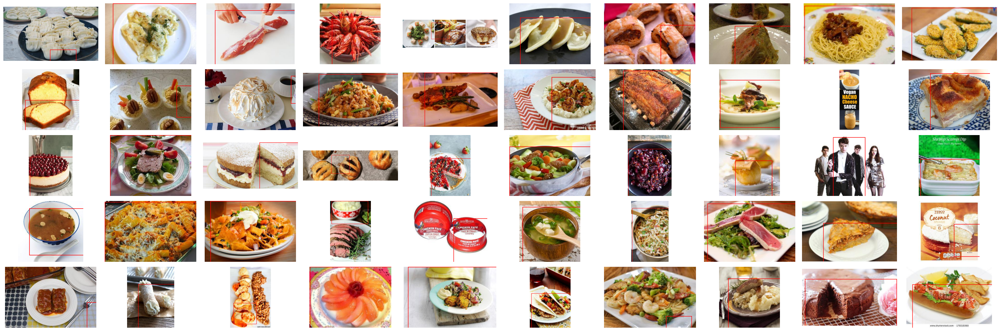

In [5]:
imgs = np.random.choice(df.Image, size=50)

fig, axs = plt.subplots(5, 10, figsize=(30, 10))
for i, img in enumerate(imgs):
  row = i // 10
  col = i % 10 
  apply_rpn(f"../Dataset/train_small/{img}", axs[row, col])

plt.tight_layout()
plt.show()

In [6]:
import cv2

def selective_search_proposals(image_path, ax, fast=True,):
    # Load Image
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    
    # Create Selective Search object
    ss = cv2.ximgproc.segmentation.createSelectiveSearchSegmentation()
    ss.setBaseImage(image)
    
    # Use fast or quality mode
    if fast:
        ss.switchToSelectiveSearchFast()
    else:
        ss.switchToSelectiveSearchQuality()
    
    # Get region proposals
    rects = ss.process()
    
    # Draw top 100 proposals
    output = image.copy()
    for (x, y, w, h) in rects[:3]:
        cv2.rectangle(output, (x, y), (x + w, y + h), (255, 0, 0), 2)
    
    # Show results
    ax.imshow(output)
    ax.axis("off")
    
    return rects

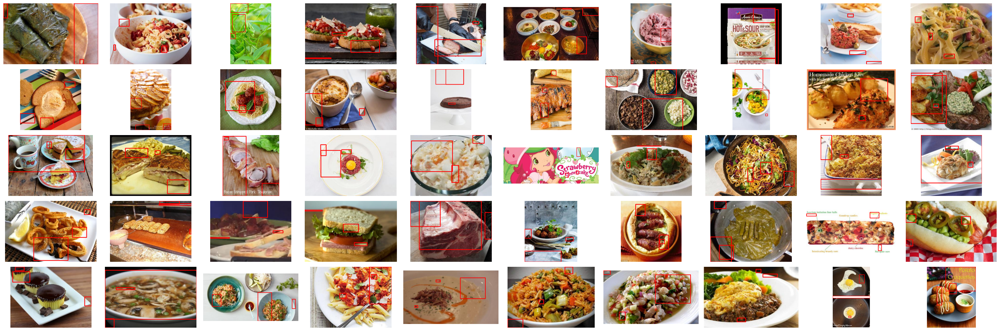

In [7]:
fig, axs = plt.subplots(5, 10, figsize=(30, 10))
for i, img in enumerate(imgs):
  row = i // 10
  col = i % 10 
  selective_search_proposals(f"../Dataset/train_small/{img}", axs[row, col])

plt.tight_layout()
plt.show()


# **Segmentation**

In [8]:
def grabcut_segmentation(image_path, ax):
    # Load image
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    
    # Define an initial rectangle (manual bounding box around food)
    height, width = image.shape[:2]
    rect = (int(width * 0.1), int(height * 0.2), int(width * 0.8), int(height * 0.7))  # Adjust as needed
    
    # Create mask and background/foreground models
    mask = np.zeros(image.shape[:2], np.uint8)
    bgdModel = np.zeros((1, 65), np.float64)
    fgdModel = np.zeros((1, 65), np.float64)
    
    # Apply GrabCut
    cv2.grabCut(image, mask, rect, bgdModel, fgdModel, 5, cv2.GC_INIT_WITH_RECT)
    
    # Create final mask: 0,2 -> background, 1,3 -> foreground
    mask_final = np.where((mask == 2) | (mask == 0), 0, 1).astype('uint8')
    segmented = image * mask_final[:, :, np.newaxis]
    
    
    ax.imshow(segmented)
    ax.title.set_text(f"Segmented Image {image_path}")
    ax.axis("off")

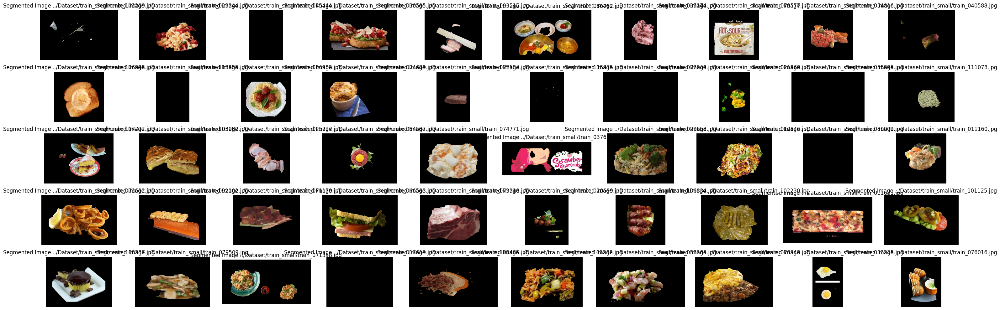

In [9]:
fig, axs = plt.subplots(5, 10, figsize=(30, 10))
for i, img in enumerate(imgs):
  row = i // 10
  col = i % 10 
  grabcut_segmentation(f"../Dataset/train_small/{img}", axs[row, col])

plt.tight_layout()
plt.show()

## Superpixel Segmentation with K-means clustering

In [ ]:
import cv2
import numpy as np
from sklearn.cluster import KMeans

In [ ]:
def superpixel_kmeans_segmentation(image_path, n_segments=2, region_size=20, ruler=15.0):
    image = cv2.imread(image_path)
    
    if image is None:
        raise ValueError("Could not read the image")
    
    slic = cv2.ximgproc.createSuperpixelSLIC(image, algorithm=cv2.ximgproc.SLICO, 
                                            region_size=region_size, ruler=ruler)
    slic.iterate(100)
    
    # Get labels and number of superpixels
    labels = slic.getLabels()
    n_superpixels = slic.getNumberOfSuperpixels()
    
    # Calculate features for each superpixel
    features = []
    for i in range(n_superpixels):
        # Create mask for current superpixel
        mask = (labels == i).astype(np.uint8)
        
        # Calculate color features (mean color in LAB space)
        lab_image = cv2.cvtColor(image, cv2.COLOR_BGR2LAB)
        mean_color = cv2.mean(lab_image, mask=mask)[:3]
        
        # Calculate position features (mean x,y coordinates)
        y_coords, x_coords = np.where(mask)
        mean_position = [np.mean(y_coords), np.mean(x_coords)]
        
        # Combine features
        features.append(list(mean_color) + mean_position)
    
    # Normalize features
    features = np.array(features)
    features = (features - features.mean(axis=0)) / features.std(axis=0)
    
    # Apply k-means clustering
    kmeans = KMeans(n_clusters=n_segments, random_state=42)
    superpixel_labels = kmeans.fit_predict(features)
    
    # Create segmented image
    segmented = np.zeros_like(image)
    labeled_image = np.zeros(image.shape[:2], dtype=np.uint8)
    
    for i in range(n_superpixels):
        mask = (labels == i)
        if superpixel_labels[i] == 1:  # Foreground
            segmented[mask] = image[mask]
            labeled_image[mask] = 255
        else:  # Background
            segmented[mask] = [128, 128, 128]  # Gray background
    
    # Create contour image for visualization
    contour_mask = slic.getLabelContourMask()
    contour_image = image.copy()
    contour_image[contour_mask == 255] = [0, 0, 255]  # Red contours
    
    return segmented, labeled_image, contour_image

def visualize_results(segmented, labeled_image, contour_image):
    """
    Display the segmentation results.
    """
    # Create a figure with all results
    fig_size = (15, 5)
    combined = np.hstack([
        segmented,
        cv2.cvtColor(labeled_image, cv2.COLOR_GRAY2BGR),
        contour_image
    ])
    
    cv2.imshow('Results (Segmented | Labels | Contours)', combined)
    cv2.waitKey(0)
    cv2.destroyAllWindows()

In [22]:
image = imgs[7]
image_path = f"../Dataset/train_small/{image}"
segmented, labeled, contours = superpixel_kmeans_segmentation(image_path)
visualize_results(segmented, labeled, contours)